In [1]:
import numpy as np
import pandas as pd
from datetime import date
from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler
from pylab import bone, pcolor, colorbar, plot, show
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist
from minisom import MiniSom
import re

In [3]:
product = pd.read_csv('Data\Mall_Customers.csv')
product['CustomerID'] = pd.to_numeric(product['CustomerID'])


In [6]:
#encoding categorical variables and standardising the data
class_le = LabelEncoder()
product['Gender'] = class_le.fit_transform(product['Gender'].values) 
for i in range(len(product)):
    product.iloc[i,[2,4]] = class_le.fit_transform(product.iloc[i,[2,4]])
sc = StandardScaler()
product_std = sc.fit_transform(product)


In [7]:
#trains a 10 x 10 self organising map on cleaned standardised data
som = MiniSom(x = 10, y = 10, input_len = 5, sigma = 1.0)
som.random_weights_init(product_std)
som.train_random(product_std, 100)


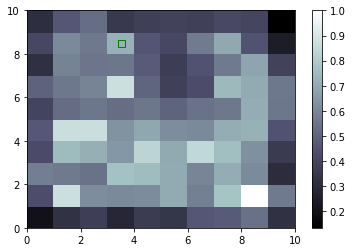

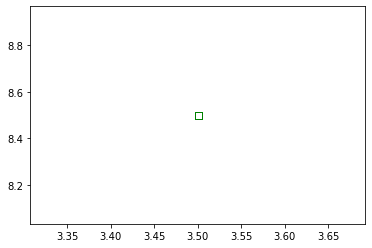

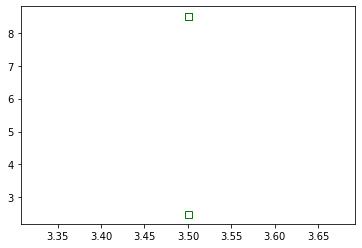

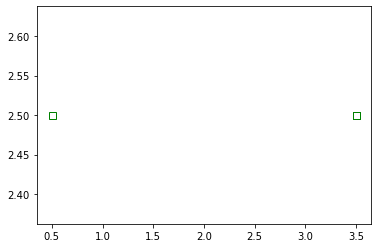

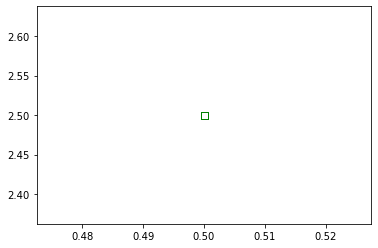

...

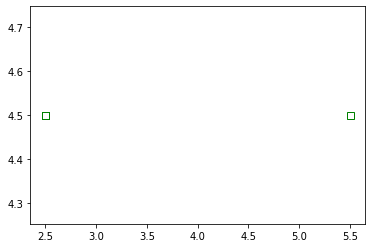

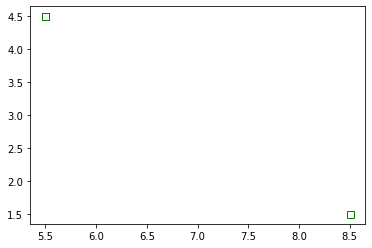

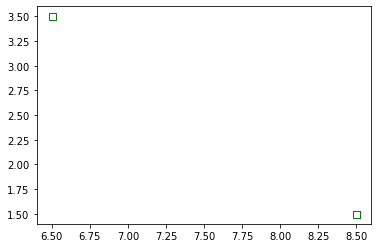

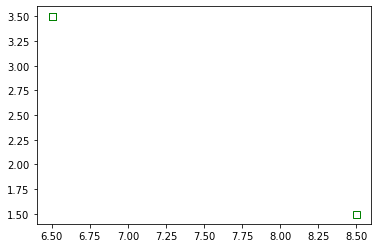

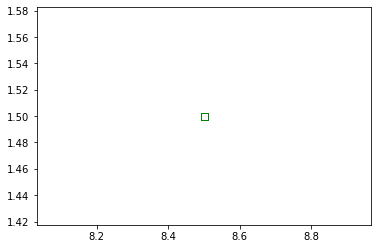

In [8]:
#plots the som map
bone()
pcolor(som.distance_map().T)
colorbar()
markers = ['o', 's']
for i, x in enumerate(product_std):
    w = som.winner(x)
    plot(w[0] +0.5, w[1]+0.5, markers[1], markeredgecolor = 'g', markerfacecolor = 'None', markersize = 7, markeredgewidth = 1)
    show()
    [plot(w[0] +0.5, w[1]+0.5, markers[1], markeredgecolor = 'g', markerfacecolor = 'None', markersize = 7, markeredgewidth = 1) for x in product_std ]


In [11]:
#weights of each trained neuron
weights = []
[weights.append(som._weights[i][j]) for i in range(10) for j in range(10)]
weights = np.array(weights)


In [13]:
from matplotlib import pyplot as plt


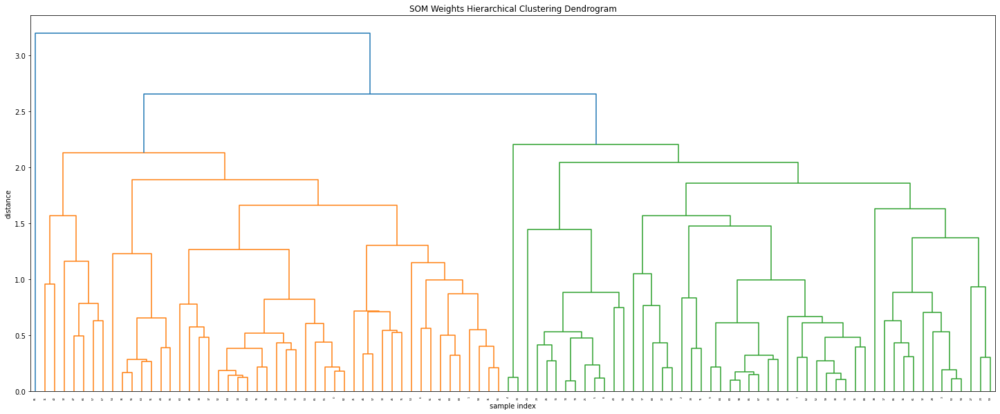

In [35]:
#performs hierarchical clustering on neuron weights and plots a dendogram
Z = linkage(weights, 'average')
c, coph_dists = cophenet(Z, pdist(weights))
plt.figure(figsize=(25, 10))
plt.title('SOM Weights Hierarchical Clustering Dendrogram')
plt.xlabel('sample index')
plt.ylabel('distance')
den = dendrogram(Z, leaf_rotation = 90, leaf_font_size = 4, get_leaves = True)
plt.show()


In [36]:
#plots fance dendograms
def fancy_dendrogram(*args, **kwargs):
    max_d = kwargs.pop('max_d', None)
    if max_d and 'color_threshold' not in kwargs:
        kwargs['color_threshold'] = max_d
    annotate_above = kwargs.pop('annotate_above', 0)

    ddata = dendrogram(*args, **kwargs)

    if not kwargs.get('no_plot', False):
        plt.title('Hierarchical Clustering Dendrogram (truncated)')
        plt.xlabel('sample index or (cluster size)')
        plt.ylabel('distance')
        for i, d, c in zip(ddata['icoord'], ddata['dcoord'], ddata['color_list']):
            x = 0.5 * sum(i[1:3])
            y = d[1]
            if y > annotate_above:
                plt.plot(x, y, 'o', c=c)
                plt.annotate("%.3g" % y, (x, y), xytext=(0, -5),
                        textcoords='offset points',
                        va='top', ha='center')
        if max_d:
            plt.axhline(y=max_d, c='k')
    return ddata



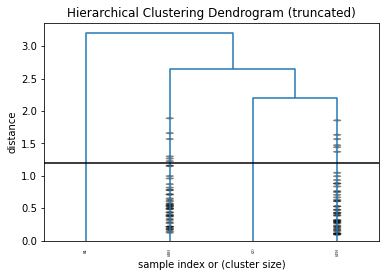

In [37]:

fancy_dendrogram(Z, truncate_mode = 'lastp', p = 4, leaf_rotation = 90, 
                leaf_font_size = 4, show_contracted = True, 
                annotate_above = 10, max_d = 1.2)


mappings = [];
[mappings.append((i,j)) for i in range(10) for j in range(10)];

In [38]:
#mapping of every data point on som
maps = som.win_map(product_std)



In [45]:
#decided four clusters from the dendogram plot
#truncating the dendogram at a distance of 1.2
cluster = [[] for i in range(4)]
for i,x in enumerate(den['leaves']):
    if i<=44:
        cluster[0].append(maps[(mappings[x])])
    elif i>44 and i<=72:
        cluster[1].append(maps[(mappings[x])])
    elif i>72 and i<=100:
        cluster[2].append(maps[(mappings[x])])
    else:
        cluster[3].append(maps[(mappings[x])])
  
